<a href="https://colab.research.google.com/github/SpeZzz0R/Models_classification/blob/main/models_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports

In [55]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import (train_test_split, GridSearchCV,
RandomizedSearchCV)
from sklearn.datasets import make_classification
from sklearn.metrics import (classification_report, confusion_matrix,
roc_curve, auc, log_loss, accuracy_score)

plt.style.use('dark_background')

# Create a data

In [56]:
X, y = make_classification(
    n_samples=20000,
    n_features=10,
    n_informative=4,
    n_redundant=3,
    n_classes=2,
    n_clusters_per_class=1,
    weights=[0.65],
    class_sep=0.85,
    shift=0.5,
    scale=5,
    random_state=42,
    )
# Создаем два класса
# Выбираем нечеткое разделение классов 0.85, чтобы выяснить "силу" различных
# моделей прогнозирования
# Создаем несбалансированные данные

In [57]:
df = pd.DataFrame(X)
df = df/100  # нормализация данных
df['y_true'] = y
df

,0,1,2,3,4,5,6,7,8,9,y_true
0,0.028339,0.162223,-0.036231,-0.012628,0.046442,0.005064,-0.053878,0.002644,0.109983,0.037103,0
1,0.087801,0.075915,0.074433,0.006860,0.001963,0.038010,-0.049498,0.038038,0.032205,0.018206,0
2,0.049368,0.111018,0.013313,0.005794,0.024510,0.098048,-0.048092,0.019438,0.063669,0.048320,0
3,-0.003482,0.185178,-0.105397,-0.031880,0.078640,0.081302,0.018634,-0.053748,0.046788,-0.054153,0
4,-0.031768,0.143782,-0.119618,-0.018597,0.086068,0.078535,0.063992,-0.057928,0.150689,-0.017907,0
...,...,...,...,...,...,...,...,...,...,...,...
19995,0.090312,0.051449,0.081116,0.019129,-0.003773,0.115230,-0.026095,0.026645,-0.019610,-0.004103,0
19996,0.119697,-0.036681,0.163165,-0.013947,-0.011103,0.065241,0.044457,0.067993,0.037313,0.016916,1
19997,-0.074184,-0.194110,0.094568,0.086199,0.017914,0.054882,0.043701,0.194809,0.115999,-0.013810,1
19998,0.080453,0.107850,0.041818,0.008470,0.009206,-0.014878,-0.052214,0.011278,0.102477,0.120830,1


In [58]:
df.y_true.mean()

0.3503

In [59]:
df['y_true'].value_counts()

0    12994
1     7006
Name: y_true, dtype: int64

In [60]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,y_true
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
mean,0.075703,0.132447,0.012887,-0.016811,0.027134,0.025551,-0.017323,-0.016845,0.025466,0.025246,0.350300
std,0.081641,0.114389,0.084079,0.059171,0.033464,0.050014,0.057547,0.065033,0.049703,0.049769,0.477076
min,-0.248280,-0.360941,-0.311001,-0.268637,-0.087658,-0.161066,-0.269874,-0.263424,-0.184929,-0.172937,0.000000
25%,0.021026,0.055682,-0.043823,-0.055267,0.002685,-0.008231,-0.056310,-0.059869,-0.008055,-0.008252,0.000000
50%,0.077827,0.132733,0.012810,-0.016011,0.024039,0.024752,-0.017089,-0.016880,0.025509,0.025485,0.000000
75%,0.132571,0.211060,0.070252,0.022069,0.049575,0.058995,0.020862,0.026949,0.059061,0.058644,1.000000
max,0.379890,0.680865,0.316768,0.259966,0.168784,0.222756,0.246284,0.260734,0.242829,0.202531,1.000000


In [61]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       20000 non-null  float64
 1   1       20000 non-null  float64
 2   2       20000 non-null  float64
 3   3       20000 non-null  float64
 4   4       20000 non-null  float64
 5   5       20000 non-null  float64
 6   6       20000 non-null  float64
 7   7       20000 non-null  float64
 8   8       20000 non-null  float64
 9   9       20000 non-null  float64
 10  y_true  20000 non-null  int64  
dtypes: float64(10), int64(1)
memory usage: 1.7 MB


In [62]:
df.groupby('y_true').mean()

,0,1,2,3,4,5,6,7,8,9
y_true,,,,,,,,,,
0,0.050990,0.143773,-0.016275,-0.017203,0.039627,0.025095,-0.017999,-0.016905,0.025004,0.024898
1,0.121537,0.111439,0.066972,-0.016083,0.003965,0.026398,-0.016069,-0.016735,0.026322,0.025893


In [63]:
df.isna().mean()

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
5         0.0
6         0.0
7         0.0
8         0.0
9         0.0
y_true    0.0
dtype: float64

In [64]:
df.corr()

,0,1,2,3,4,5,6,7,8,9,y_true
0,1.000000,0.393237,0.613665,-0.642471,-0.553957,0.008134,-0.244797,-0.369451,0.018205,0.024517,0.412245
1,0.393237,1.000000,-0.450801,-0.818423,0.461812,-0.004155,-0.432836,-0.775365,0.007140,0.008373,-0.134853
2,0.613665,-0.450801,1.000000,0.066374,-0.933426,0.008199,-0.056039,0.438468,0.010413,0.015993,0.472356
3,-0.642471,-0.818423,0.066374,1.000000,-0.257114,-0.003684,0.173466,0.637348,-0.009511,-0.017668,0.009035
4,-0.553957,0.461812,-0.933426,-0.257114,1.000000,-0.005893,0.149984,-0.387902,-0.011234,-0.012418,-0.508400
5,0.008134,-0.004155,0.008199,-0.003684,-0.005893,1.000000,0.013582,-0.004672,0.003588,0.009010,0.012432
6,-0.244797,-0.432836,-0.056039,0.173466,0.149984,0.013582,1.000000,-0.120259,-0.004206,-0.002322,0.016006
7,-0.369451,-0.775365,0.438468,0.637348,-0.387902,-0.004672,-0.120259,1.000000,-0.008900,-0.008152,0.001245
8,0.018205,0.007140,0.010413,-0.009511,-0.011234,0.003588,-0.004206,-0.008900,1.000000,0.004411,0.012654
9,0.024517,0.008373,0.015993,-0.017668,-0.012418,0.009010,-0.002322,-0.008152,0.004411,1.000000,0.009536


In [65]:
X_train, X_test, y_train, y_test = train_test_split(
    df.drop('y_true', axis=1),
    df.y_true,
    train_size=0.6,
    stratify=df.y_true,
    random_state=42
    )

In [66]:
X_test, X_val, y_test, y_val = train_test_split(
    X_test,
    y_test,
    test_size=0.5,
    stratify=y_test,
    random_state=42
    )

In [67]:
len(X_train), len(X_test), len(X_val)

(12000, 4000, 4000)

In [68]:
y_train.mean(), y_test.mean(), y_val.mean()

(0.35033333333333333, 0.35025, 0.35025)

In [69]:
y_train.value_counts(), y_test.value_counts(), y_val.value_counts()

(0    7796
 1    4204
 Name: y_true, dtype: int64,
 0    2599
 1    1401
 Name: y_true, dtype: int64,
 0    2599
 1    1401
 Name: y_true, dtype: int64)

CPU times: user 1min 59s, sys: 9.79 s, total: 2min 8s
Wall time: 2min 3s


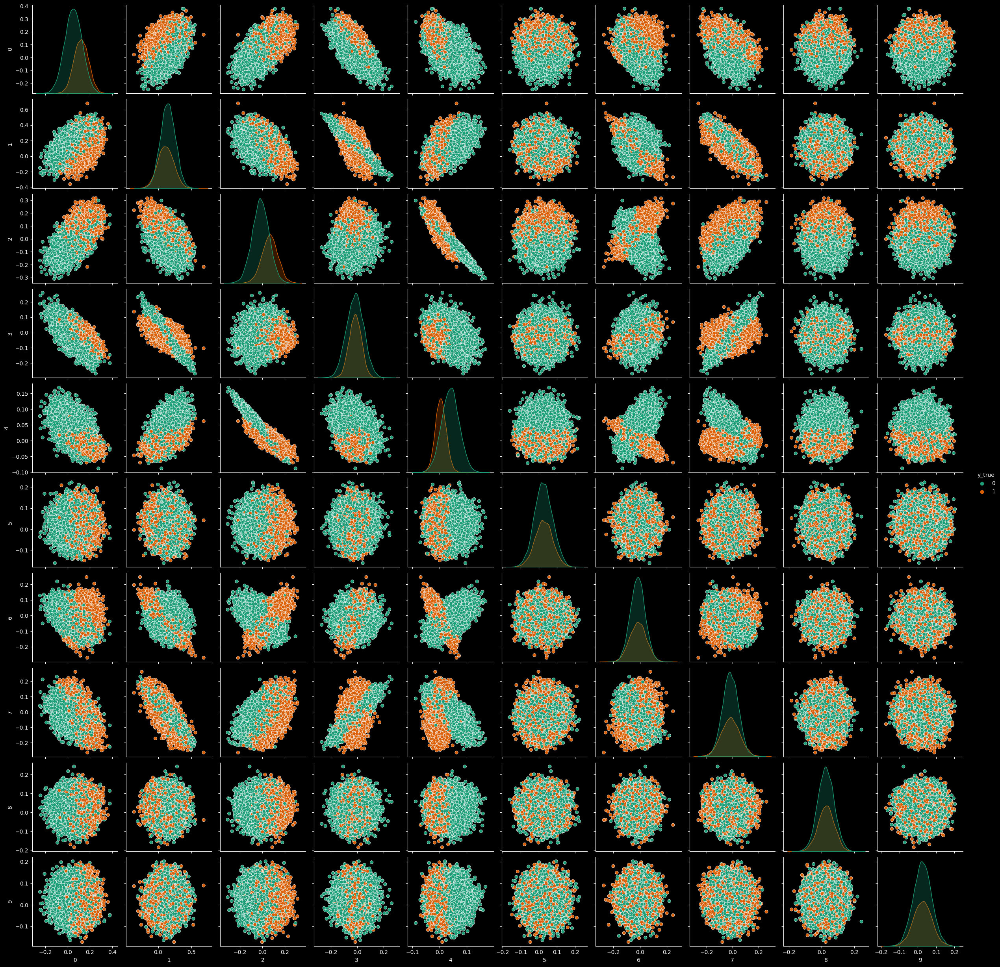

In [70]:
 %%time
 sns.pairplot(df, hue='y_true', palette='Dark2')

# Model - Logistic Regression

In [71]:
from sklearn.linear_model import LogisticRegression

In [72]:
log_reg_param_grid = [
    {'solver': ['lbfgs'],
     'penalty': ['l2', None],
     'C': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10],
     'class_weight': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65},
                      'auto', None],
     'multi_class': ['auto', 'ovr', 'multinomial'],
     'n_jobs': [-1]
     },
    {'solver': ['liblinear'],
     'penalty': ['l1', 'l2'],
     'C': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10],
     'intercept_scaling': [0.01, 0.1, 1, 10, 100],
     'class_weight': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65},
                      'auto', None],
     'multi_class': ['auto', 'ovr'],
     'n_jobs': [-1]
     },
    {'solver': ['newton-cg'],
     'penalty': ['l2', None],
     'C': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10],
     'class_weight': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65},
                      'auto', None],
     'multi_class': ['auto', 'ovr', 'multinomial'],
     'n_jobs': [-1]
     },
    {'solver': ['newton-cholesky'],
     'penalty': ['l2', None],
     'C': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10],
     'class_weight': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65},
                      'auto', None],
     'multi_class': ['auto', 'ovr', 'multinomial'],
     'n_jobs': [-1]
     },
    {'solver': ['sag'],
     'penalty': ['l2', None],
     'C': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10],
      'class_weight': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65},
                      'auto', None],
     'multi_class': ['auto', 'ovr', 'multinomial'],
     'n_jobs': [-1]
     },
    {'solver': ['saga'],
     'penalty': ['l2', 'l1', 'elasticnet', None],
     'C': [0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10],
     'class_weight': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65},
                      'auto', None],
     'multi_class': ['auto', 'ovr', 'multinomial'],
     'l1_ratio': [0.001, 0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, None],
     'n_jobs': [-1]
     },
]


log_reg = LogisticRegression()
# log_reg_search = GridSearchCV(log_reg, log_reg_param_grid, cv=5,
#                                   scoring='neg_mean_squared_error')

log_reg_search = RandomizedSearchCV(
    log_reg,
    n_iter=500,
    param_distributions=log_reg_param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    verbose=50,
    random_state=42,
    return_train_score=True
    )
# log_reg_search.fit(X_train, y_train)
# best_params = log_reg_search.best_params_
# print(best_params)

# лучшие параметры: {'solver': 'saga', 'penalty': None, 'n_jobs': -1,
# 'multi_class': 'ovr', 'l1_ratio': None, 'class_weight': {0: 0.35, 1: 0.65},
# 'C': 0.1}

In [73]:
log_reg = LogisticRegression(
    penalty=None,
    C=0.1,
    solver='saga',
    multi_class='ovr',
    random_state=42,
    n_jobs=-1,
    verbose=100,
    )
log_reg.fit(X_train, y_train)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
convergence after 18 epochs took 1 seconds
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.1s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:1181: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(


LogisticRegression(C=0.1, multi_class='ovr', n_jobs=-1, penalty=None,
                   random_state=42, solver='saga', verbose=100)

In [74]:
log_reg.predict_proba(X_test)[:10]

array([[0.76808191, 0.23191809],
       [0.82447595, 0.17552405],
       [0.91773158, 0.08226842],
       [0.89656654, 0.10343346],
       [0.3553966 , 0.6446034 ],
       [0.97756273, 0.02243727],
       [0.65449655, 0.34550345],
       [0.79652934, 0.20347066],
       [0.41949551, 0.58050449],
       [0.54723186, 0.45276814]])

In [75]:
X_test_copy = X_test.copy()

In [76]:
test = pd.DataFrame(X_test_copy)
test['y_true'] = pd.Series(y_test)
test['y_score'] = log_reg.predict_proba(X_test)[:, 1]
test['y_pred'] = (test['y_score'] >= 0.5) * 1
test

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.231918,0
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.175524,0
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.082268,0
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.103433,0
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.644603,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.020640,0
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.853938,1
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.351229,0
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.561993,1


In [77]:
test.y_true.mean(), test.y_pred.mean()

(0.35025, 0.2895)

In [78]:
test.y_true.value_counts(), test.y_pred.value_counts()

(0    2599
 1    1401
 Name: y_true, dtype: int64,
 0    2842
 1    1158
 Name: y_pred, dtype: int64)

In [79]:
def get_conf_matrix(row):
  if row['y_true'] == 1 and row['y_pred'] == 1:
    return 'tp'
  if row['y_true'] == 0 and row['y_pred'] == 0:
    return 'tn'
  if row['y_true'] == 1 and row['y_pred'] == 0:
    return 'fn'
  if row['y_true'] == 0 and row['y_pred'] == 1:
    return 'fp'

In [80]:
test['conf_matrix'] = test.apply(get_conf_matrix, axis=1)
test

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred,conf_matrix
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.231918,0,tn
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.175524,0,tn
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.082268,0,tn
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.103433,0,tn
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.644603,1,tp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.020640,0,tn
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.853938,1,tp
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.351229,0,fn
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.561993,1,tp


In [81]:
test.conf_matrix.value_counts()

tn    2294
tp     853
fn     548
fp     305
Name: conf_matrix, dtype: int64

### Attributes and Visualization

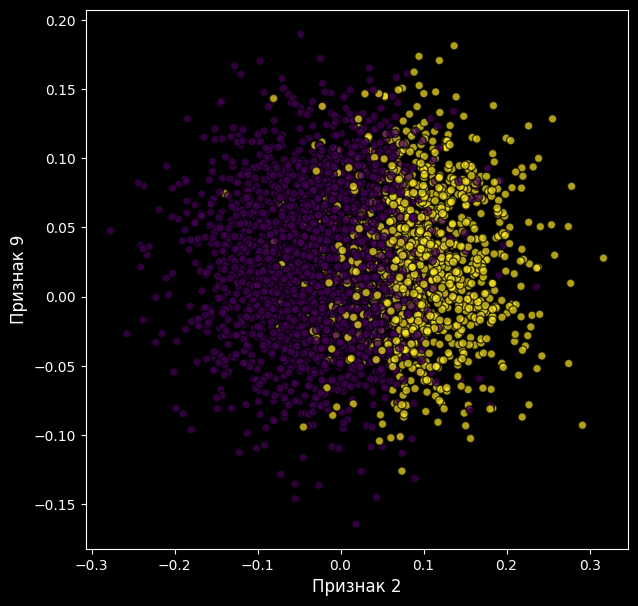

In [82]:
plt.figure(figsize=(7, 7))
plt.scatter(X_test[2], X_test[9], c=log_reg.predict(X_test), cmap='viridis',
            marker='o', edgecolors='k', alpha=0.7)
plt.xlabel('Признак 2', fontsize=12)
plt.ylabel('Признак 9', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

# без разделяющей линии

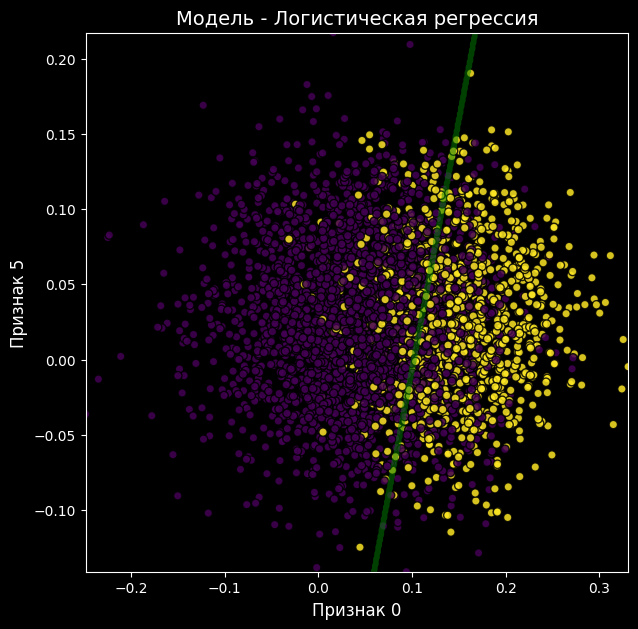

In [83]:
# Создание сетки для построения разделяющей линии
xx, yy = np.meshgrid(np.linspace(X_test[0].min(), X_test[0].max(), 500),
                     np.linspace(X_test[5].min(), X_test[5].max(), 500))

# Получение предсказаний для каждой точки на сетке
Z = log_reg.predict(np.c_[xx.ravel(), yy.ravel(),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel())])
Z = Z.reshape(xx.shape)

# Визуализация данных
plt.figure(figsize=(7, 7))
plt.scatter(X_test[0], X_test[5], c=log_reg.predict(X_test), cmap='viridis',
            marker='o', edgecolors='k', alpha=0.85)

# Визуализация разделяющей линии
plt.contour(xx, yy, Z, levels=[0], linewidths=4, colors='green', alpha=0.5)

# Дополнительные детали графика
plt.xlabel('Признак 0', fontsize=12)
plt.ylabel('Признак 5', fontsize=12)
plt.title('Модель - Логистическая регрессия', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

In [84]:
log_reg_columns = list(range(10))
log_reg_columns_df = pd.DataFrame({
    'Feature': log_reg_columns, 'Coef': np.round(log_reg.coef_.flatten(), 4)})
log_reg_columns_df = log_reg_columns_df.sort_values(by='Coef', ascending=False)
log_reg_columns_df

,Feature,Coef
0,0,11.6695
3,3,11.5307
2,2,7.9240
5,5,0.5830
8,8,-0.0308
9,9,-0.3768
6,6,-1.7881
1,1,-3.5198
4,4,-9.4244
7,7,-11.3432


In [85]:
print('Intercept:', round(log_reg.intercept_[0], 4))

Intercept: -1.1963


### Metrics

In [86]:
logloss = log_loss(test['y_true'], test['y_score'])
print(f'Log Loss на тестовых данных: {logloss:.4f}')

Log Loss на тестовых данных: 0.4574


In [87]:
print(f'Score на тренировочных данных: {log_reg.score(X_train, y_train):.4f}')
print(f'Score на тестовых данных: {log_reg.score(X_test, y_test):.4f}')

Score на тренировочных данных: 0.7768
Score на тестовых данных: 0.7867


In [88]:
tn, fp, fn, tp = confusion_matrix(test.y_true, test.y_pred).ravel()
tn, fp, fn, tp

(2294, 305, 548, 853)

In [89]:
print(classification_report(test['y_true'], test['y_pred']))

              precision    recall  f1-score   support

           0       0.81      0.88      0.84      2599
           1       0.74      0.61      0.67      1401

    accuracy                           0.79      4000
   macro avg       0.77      0.75      0.75      4000
weighted avg       0.78      0.79      0.78      4000



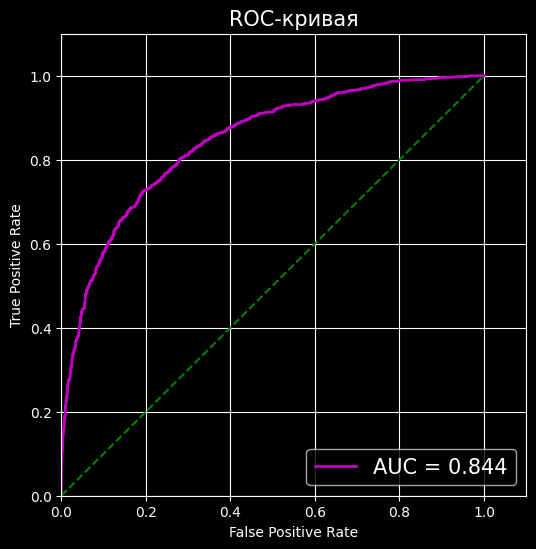

In [90]:
fpr, tpr, threshold = roc_curve(test['y_true'], test['y_score'])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))

plt.plot(fpr, tpr, color='m', linewidth=2, label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], 'g--')
plt.xlim([0, 1.1])
plt.ylim([0, 1.1])
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().grid(True)

plt.title('ROC-кривая', fontsize=15)
plt.legend(loc='lower right', fontsize=15)
plt.xlabel('False Positive Rate', fontsize=10)
plt.ylabel('True Positive Rate', fontsize=10)

plt.show()

# Model - MLP

In [91]:
from sklearn.neural_network import MLPClassifier

In [92]:
# %%time
mlp_param_grid = {
    'hidden_layer_sizes': [10, 50, 100, (10, 10), (50, 50), (100, 100),
     (10, 10, 10), (50, 50, 50), (100, 100, 100)],
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver': ['lbfgs', 'sgd', 'adam'],
    'alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10],
    'batch_size': ['auto', 100, 500, 1000, 2000, 5000],
    'learning_rate': ['constant', 'invscaling', 'adaptive'],
    'learning_rate_init': [0.001, 0.001, 0.01, 0.1, 1, 10],
    'power_t': [0, 0.5, 1],
    'random_state': [42],
    'beta_1': [0, 0.2, 0.5, 0.75, 0.99],
    'beta_2': [0, 0.2, 0.5, 0.75, 0.99],
    'n_iter_no_change': [25]
}


mlp = MLPClassifier()

mlp_search = RandomizedSearchCV(
    mlp,
    n_iter=500,
    param_distributions=mlp_param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    verbose=50,
    random_state=42,
    return_train_score=True
    )
# mlp_search.fit(X_train, y_train)
# best_params = mlp_search.best_params_
# print(best_params)

# лучшие параметры: {'solver': 'lbfgs', 'random_state': 42, 'power_t': 0,
# 'n_iter_no_change': 25, 'learning_rate_init': 1,
# 'learning_rate': 'invscaling', 'hidden_layer_sizes': (50, 50), 'beta_2': 0.2,
# 'beta_1': 0, 'batch_size': 100, 'alpha': 0.0001, 'activation': 'tanh'}

In [93]:
%%time
mlp = MLPClassifier(
    hidden_layer_sizes=(50, 50),
    activation='tanh',
    solver='lbfgs',
    alpha=0.01,
    batch_size=100,
    max_iter=200,
    verbose=True,
    n_iter_no_change=25,
    random_state=42,
)
mlp.fit(X_train, y_train)

CPU times: user 9.5 s, sys: 4.41 s, total: 13.9 s
Wall time: 9.49 s


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


MLPClassifier(activation='tanh', alpha=0.01, batch_size=100,
              hidden_layer_sizes=(50, 50), n_iter_no_change=25, random_state=42,
              solver='lbfgs', verbose=True)

In [94]:
mlp.predict_proba(X_test)[:10]

array([[9.96484418e-01, 3.51558189e-03],
       [9.68655366e-01, 3.13446343e-02],
       [9.93676521e-01, 6.32347918e-03],
       [9.98474494e-01, 1.52550571e-03],
       [1.15518235e-01, 8.84481765e-01],
       [9.95627618e-01, 4.37238192e-03],
       [6.62734738e-04, 9.99337265e-01],
       [9.97008109e-01, 2.99189122e-03],
       [1.96067646e-01, 8.03932354e-01],
       [6.87780842e-01, 3.12219158e-01]])

In [95]:
X_test_copy2 = X_test.copy()

In [96]:
test2 = pd.DataFrame(X_test_copy2)
test2['y_true'] = pd.Series(y_test)
test2['y_score'] = mlp.predict_proba(X_test)[:, 1]
test2['y_pred'] = (test2['y_score'] >= 0.5) * 1
test2

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.003516,0
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.031345,0
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.006323,0
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.001526,0
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.884482,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.002464,0
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.981017,1
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.328587,0
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.992591,1


In [97]:
test2.y_true.mean(), test2.y_pred.mean()

(0.35025, 0.3275)

In [98]:
test2.y_true.value_counts(), test2.y_pred.value_counts()

(0    2599
 1    1401
 Name: y_true, dtype: int64,
 0    2690
 1    1310
 Name: y_pred, dtype: int64)

In [99]:
test2['conf_matrix'] = test2.apply(get_conf_matrix, axis=1)
test2

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred,conf_matrix
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.003516,0,tn
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.031345,0,tn
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.006323,0,tn
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.001526,0,tn
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.884482,1,tp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.002464,0,tn
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.981017,1,tp
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.328587,0,fn
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.992591,1,tp


In [100]:
test2.conf_matrix.value_counts()

tn    2527
tp    1238
fn     163
fp      72
Name: conf_matrix, dtype: int64

### Visualization

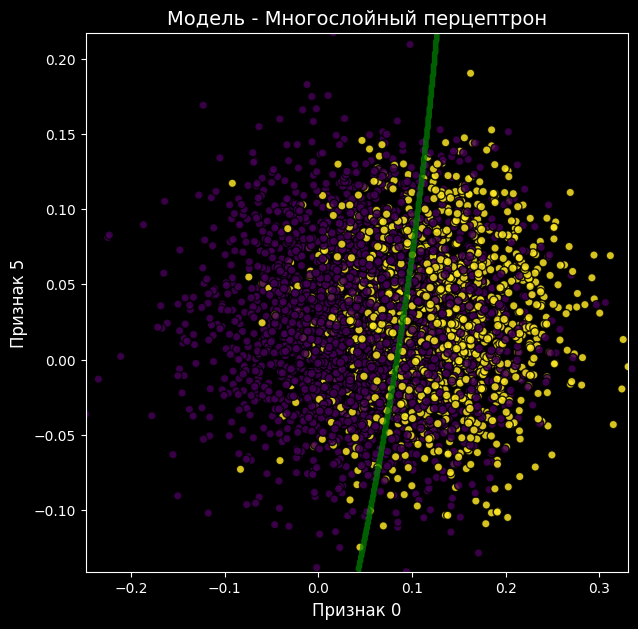

In [101]:
# Создание сетки для построения разделяющей линии
xx, yy = np.meshgrid(np.linspace(X_test[0].min(), X_test[0].max(), 500),
                     np.linspace(X_test[5].min(), X_test[5].max(), 500))

# Получение предсказаний для каждой точки на сетке
Z = mlp.predict(np.c_[xx.ravel(), yy.ravel(),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel())])
Z = Z.reshape(xx.shape)

# Визуализация данных
plt.figure(figsize=(7, 7))
plt.scatter(X_test[0], X_test[5], c=mlp.predict(X_test), cmap='viridis',
            marker='o', edgecolors='k', alpha=0.85)

# Визуализация разделяющей линии
plt.contour(xx, yy, Z, levels=[0], linewidths=4, colors='green', alpha=0.75)

# Дополнительные детали графика
plt.xlabel('Признак 0', fontsize=12)
plt.ylabel('Признак 5', fontsize=12)
plt.title('Модель - Многослойный перцептрон', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

### Metrics

In [102]:
logloss = log_loss(test2['y_true'], test2['y_score'])
print(f'Log Loss на тестовых данных: {logloss:.4f}')

Log Loss на тестовых данных: 0.1482


In [103]:
print(f'Score на тренировочных данных: {mlp.score(X_train, y_train):.4f}')
print(f'Score на тестовых данных: {mlp.score(X_test, y_test):.4f}')

Score на тренировочных данных: 0.9375
Score на тестовых данных: 0.9413


In [104]:
tn, fp, fn, tp = confusion_matrix(test2.y_true, test2.y_pred).ravel()
tn, fp, fn, tp

(2527, 72, 163, 1238)

In [105]:
print(classification_report(test2['y_true'], test2['y_pred']))

              precision    recall  f1-score   support

           0       0.94      0.97      0.96      2599
           1       0.95      0.88      0.91      1401

    accuracy                           0.94      4000
   macro avg       0.94      0.93      0.93      4000
weighted avg       0.94      0.94      0.94      4000



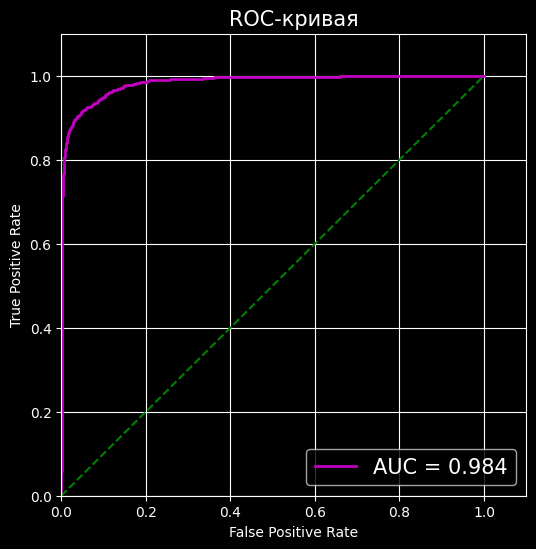

In [106]:
fpr, tpr, threshold = roc_curve(test2['y_true'], test2['y_score'])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))

plt.plot(fpr, tpr, color='m', linewidth=2, label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], 'g--')
plt.xlim([0, 1.1])
plt.ylim([0, 1.1])
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().grid(True)

plt.title('ROC-кривая', fontsize=15)
plt.legend(loc='lower right', fontsize=15)
plt.xlabel('False Positive Rate', fontsize=10)
plt.ylabel('True Positive Rate', fontsize=10)

plt.show()

# Model - CatBoost

In [107]:
! pip install CatBoost

  Using cached catboost-1.2.2-cp310-cp310-manylinux2014_x86_64.whl (98.7 MB)


In [108]:
from catboost import CatBoostClassifier, Pool

In [109]:
# %%time
cat_param_grid = {
    'loss_function': ['Logloss', 'CrossEntropy'],
    'eval_metric': ['Logloss', 'CrossEntropy', 'F1', 'AUC'],
    'learning_rate': [0.001, 0.01, 0.1, 1],
    'random_seed': [42],
    'l2_leaf_reg': [0, 0.5, 3, 10],
    'mvs_reg': [0, 1, 5],
    'depth': [4, 6, 8],
    'grow_policy': ['SymmetricTree', 'Depthwise', 'Lossguide'],
    'rsm': [0.8],
    'class_weights': [{0: 1.0, 1: 2.0}, None],
}


cat = CatBoostClassifier()

cat_search = RandomizedSearchCV(
    cat,
    n_iter=200,
    param_distributions=cat_param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    verbose=50,
    random_state=42,
    return_train_score=True
    )
# cat_search.fit(X_train, y_train)
# best_params = cat_search.best_params_
# print(best_params)

# лучшие параметры: {'rsm': 0.8, 'random_seed': 42, 'mvs_reg': 5,
# 'loss_function': 'Logloss', 'learning_rate': 0.1, 'l2_leaf_reg': 0,
# 'grow_policy': 'Depthwise', 'eval_metric': 'AUC', 'depth': 6,
# 'class_weights': {0: 1.0, 1: 2.0}}

In [110]:
params = {
    'learning_rate': 0.025,
    'mvs_reg': 5,
    'random_seed': 42,
    'verbose': 100,
}

In [111]:
train_data = Pool(
    data=X_train,
    label=y_train,
)

valid_data = Pool(
    data=X_val,
    label=y_val,
)

In [112]:
%%time
cat = CatBoostClassifier(**params)
cat.fit(train_data, eval_set=valid_data)

0:	learn: 0.6655991	test: 0.6652076	best: 0.6652076 (0)	total: 54.6ms	remaining: 54.5s
100:	learn: 0.2171935	test: 0.2134612	best: 0.2134612 (100)	total: 696ms	remaining: 6.19s
200:	learn: 0.1839214	test: 0.1836475	best: 0.1836475 (200)	total: 1.33s	remaining: 5.3s
300:	learn: 0.1679889	test: 0.1725375	best: 0.1725375 (300)	total: 1.98s	remaining: 4.61s
400:	learn: 0.1568630	test: 0.1672099	best: 0.1672099 (400)	total: 2.6s	remaining: 3.88s
500:	learn: 0.1472963	test: 0.1638448	best: 0.1638428 (499)	total: 3.23s	remaining: 3.22s
600:	learn: 0.1392073	test: 0.1620252	best: 0.1620252 (600)	total: 3.89s	remaining: 2.58s
700:	learn: 0.1320471	test: 0.1610191	best: 0.1610191 (700)	total: 4.5s	remaining: 1.92s
800:	learn: 0.1253483	test: 0.1605382	best: 0.1604784 (795)	total: 5.17s	remaining: 1.28s
900:	learn: 0.1191870	test: 0.1599359	best: 0.1599006 (896)	total: 6.58s	remaining: 723ms
999:	learn: 0.1138415	test: 0.1599516	best: 0.1598681 (914)	total: 8.03s	remaining: 0us

bestTest = 0.1598

In [113]:
for key,value in cat.get_all_params().items():
 print(f'{key}: {value}')

nan_mode: Min
eval_metric: Logloss
iterations: 1000
sampling_frequency: PerTree
leaf_estimation_method: Newton
random_score_type: NormalWithModelSizeDecrease
grow_policy: SymmetricTree
penalties_coefficient: 1
boosting_type: Plain
model_shrink_mode: Constant
feature_border_type: GreedyLogSum
bayesian_matrix_reg: 0.10000000149011612
eval_fraction: 0
force_unit_auto_pair_weights: False
l2_leaf_reg: 3
random_strength: 1
rsm: 1
boost_from_average: False
model_size_reg: 0.5
pool_metainfo_options: {'tags': {}}
subsample: 0.800000011920929
use_best_model: True
class_names: [0, 1]
random_seed: 42
depth: 6
posterior_sampling: False
border_count: 254
mvs_reg: 5
classes_count: 0
auto_class_weights: None
sparse_features_conflict_fraction: 0
leaf_estimation_backtracking: AnyImprovement
best_model_min_trees: 1
model_shrink_rate: 0
min_data_in_leaf: 1
loss_function: Logloss
learning_rate: 0.02500000037252903
score_function: Cosine
task_type: CPU
leaf_estimation_iterations: 10
bootstrap_type: MVS
max_

In [114]:
cat.predict_proba(X_test)[:10]

array([[0.97520983, 0.02479017],
       [0.92142681, 0.07857319],
       [0.9975855 , 0.0024145 ],
       [0.99654508, 0.00345492],
       [0.05744154, 0.94255846],
       [0.94816852, 0.05183148],
       [0.04788128, 0.95211872],
       [0.99698202, 0.00301798],
       [0.31268265, 0.68731735],
       [0.57488798, 0.42511202]])

In [115]:
X_test_copy3 = X_test.copy()

In [116]:
test3 = pd.DataFrame(X_test_copy3)
test3['y_true'] = pd.Series(y_test)
test3['y_score'] = cat.predict_proba(X_test)[:, 1]
test3['y_pred'] = (test3['y_score'] >= 0.5) * 1
test3

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.024790,0
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.078573,0
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.002415,0
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.003455,0
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.942558,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.012877,0
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.971751,1
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.377521,0
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.996572,1


In [117]:
test3.y_true.mean(), test3.y_pred.mean()

(0.35025, 0.324)

In [118]:
test3.y_true.value_counts(), test3.y_pred.value_counts()

(0    2599
 1    1401
 Name: y_true, dtype: int64,
 0    2704
 1    1296
 Name: y_pred, dtype: int64)

In [119]:
test3['conf_matrix'] = test3.apply(get_conf_matrix, axis=1)
test3

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred,conf_matrix
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.024790,0,tn
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.078573,0,tn
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.002415,0,tn
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.003455,0,tn
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.942558,1,tp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.012877,0,tn
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.971751,1,tp
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.377521,0,fn
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.996572,1,tp


In [120]:
test3.conf_matrix.value_counts()

tn    2528
tp    1225
fn     176
fp      71
Name: conf_matrix, dtype: int64

### Attributes and Visualization

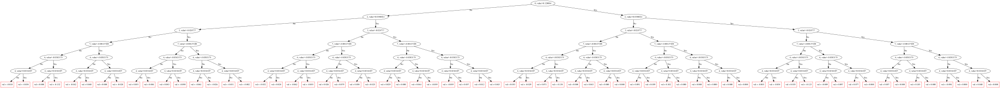

In [121]:
cat.plot_tree(tree_idx=0)  # визуализация дерева с индексом 0

In [122]:
cat.get_feature_importance(prettified=True)

,Feature Id,Importances
0,4,25.452869
1,6,21.141169
2,7,19.268999
3,3,13.717804
4,2,8.210268
5,0,3.470719
6,8,2.282613
7,9,2.194451
8,5,2.186452
9,1,2.074655


In [123]:
cat.tree_count_  # на этом дереве у модели появляется переобучение

915

### Metrics

In [124]:
logloss = log_loss(test3['y_true'], test3['y_score'])
print(f'Log Loss на тестовых данных: {logloss:.4f}')

Log Loss на тестовых данных: 0.1639


In [125]:
print(f'Score на тренировочных данных: {cat.score(X_train, y_train):.4f}')
print(f'Score на тестовых данных: {cat.score(X_test, y_test):.4f}')

Score на тренировочных данных: 0.9638
Score на тестовых данных: 0.9383


In [126]:
tn, fp, fn, tp = confusion_matrix(test3.y_true, test3.y_pred).ravel()
tn, fp, fn, tp

(2528, 71, 176, 1225)

In [127]:
print(classification_report(test3['y_true'], test3['y_pred']))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2599
           1       0.95      0.87      0.91      1401

    accuracy                           0.94      4000
   macro avg       0.94      0.92      0.93      4000
weighted avg       0.94      0.94      0.94      4000



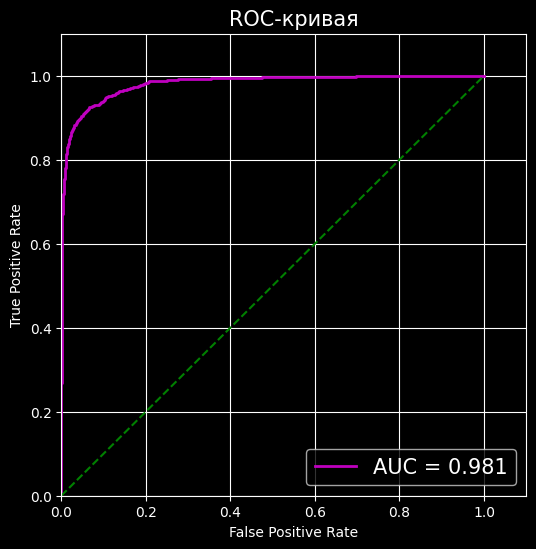

In [128]:
fpr, tpr, threshold = roc_curve(test3['y_true'], test3['y_score'])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))

plt.plot(fpr, tpr, color='m', linewidth=2, label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], 'g--')
plt.xlim([0, 1.1])
plt.ylim([0, 1.1])
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().grid(True)

plt.title('ROC-кривая', fontsize=15)
plt.legend(loc='lower right', fontsize=15)
plt.xlabel('False Positive Rate', fontsize=10)
plt.ylabel('True Positive Rate', fontsize=10)

plt.show()

# Model - Random Forest

In [129]:
from sklearn.ensemble import RandomForestClassifier

In [130]:
# %%time
rand_for_param_grid = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': [6, 8, 10],
    'random_state': [42],
    'n_jobs': [-1],
    'class_weight': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65}, None, 'balanced',
                     'balanced_subsample']
}

rand_for = RandomForestClassifier()
rand_for_search = RandomizedSearchCV(
    rand_for,
    n_iter=100,
    param_distributions=rand_for_param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    verbose=50,
    random_state=42,
    return_train_score=True
    )
# rand_for_search.fit(X_train, y_train)
# best_params = rand_for_search.best_params_
# print(best_params)

# лучшие параметры: {'random_state': 42, 'n_jobs': -1, 'max_depth': 10,
# 'criterion': 'gini', 'class_weight': None}

In [131]:
%%time
rand_for = RandomForestClassifier(
    criterion='gini',
    max_depth=10,
    random_state=42,
    n_jobs=-1,
)
rand_for.fit(X_train, y_train)

CPU times: user 4.04 s, sys: 28.9 ms, total: 4.06 s
Wall time: 2.16 s


RandomForestClassifier(max_depth=10, n_jobs=-1, random_state=42)

In [132]:
rand_for.predict_proba(X_test)[:10]

array([[0.93584021, 0.06415979],
       [0.94478191, 0.05521809],
       [0.99539659, 0.00460341],
       [0.99666369, 0.00333631],
       [0.06991309, 0.93008691],
       [0.97049886, 0.02950114],
       [0.1151238 , 0.8848762 ],
       [0.99323084, 0.00676916],
       [0.28225191, 0.71774809],
       [0.55232062, 0.44767938]])

In [133]:
X_test_copy4 = X_test.copy()

In [134]:
test4 = pd.DataFrame(X_test_copy4)
test4['y_true'] = pd.Series(y_test)
test4['y_score'] = rand_for.predict_proba(X_test)[:, 1]
test4['y_pred'] = (test4['y_score'] >= 0.5) * 1
test4

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.064160,0
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.055218,0
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.004603,0
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.003336,0
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.930087,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.004793,0
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.927984,1
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.424261,0
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.934712,1


In [135]:
test4.y_true.mean(), test4.y_pred.mean()

(0.35025, 0.3175)

In [136]:
test4.y_true.value_counts(), test4.y_pred.value_counts()

(0    2599
 1    1401
 Name: y_true, dtype: int64,
 0    2730
 1    1270
 Name: y_pred, dtype: int64)

In [137]:
test4['conf_matrix'] = test4.apply(get_conf_matrix, axis=1)
test4

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred,conf_matrix
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.064160,0,tn
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.055218,0,tn
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.004603,0,tn
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.003336,0,tn
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.930087,1,tp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.004793,0,tn
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.927984,1,tp
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.424261,0,fn
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.934712,1,tp


In [138]:
test4.conf_matrix.value_counts()

tn    2523
tp    1194
fn     207
fp      76
Name: conf_matrix, dtype: int64

### Attributes and Visualization

In [139]:
from sklearn.tree import export_graphviz
from IPython.display import Image
import pydotplus

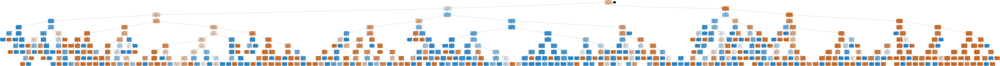

In [140]:
tree = rand_for.estimators_[0]
class_names = test4['y_true'].unique().astype(str)
feature_names = test4.drop(['y_true', 'y_score', 'y_pred', 'conf_matrix'],
                           axis=1).columns

dot_data = export_graphviz(
    tree,
    out_file=None,
    feature_names=feature_names,
    class_names=class_names,
    filled=True,
    rounded=True,
    special_characters=True
    )

graph = pydotplus.graph_from_dot_data(dot_data)
graph.write_png('tree.png')
Image(graph.create_png())

In [141]:
feature_names = list(range(10))
feature_importance_df = pd.DataFrame({
    'Feature': feature_names, 'Importance': rand_for.feature_importances_})
feature_importance_df = feature_importance_df.sort_values(by='Importance',
                                                          ascending=False)
feature_importance_df

,Feature,Importance
4,4,0.281929
6,6,0.172257
2,2,0.143614
7,7,0.126996
0,0,0.102878
3,3,0.091689
1,1,0.049227
5,5,0.011302
9,9,0.010452
8,8,0.009657


### Metrics

In [142]:
logloss = log_loss(test4['y_true'], test4['y_score'])
print(f'Log Loss на тестовых данных: {logloss:.4f}')

Log Loss на тестовых данных: 0.1998


In [143]:
print(f'Score на тренировочных данных: {rand_for.score(X_train, y_train):.4f}')
print(f'Score на тестовых данных: {rand_for.score(X_test, y_test):.4f}')

Score на тренировочных данных: 0.9564
Score на тестовых данных: 0.9293


In [144]:
tn, fp, fn, tp = confusion_matrix(test4.y_true, test4.y_pred).ravel()
tn, fp, fn, tp

(2523, 76, 207, 1194)

In [145]:
print(classification_report(test4['y_true'], test4['y_pred']))

              precision    recall  f1-score   support

           0       0.92      0.97      0.95      2599
           1       0.94      0.85      0.89      1401

    accuracy                           0.93      4000
   macro avg       0.93      0.91      0.92      4000
weighted avg       0.93      0.93      0.93      4000



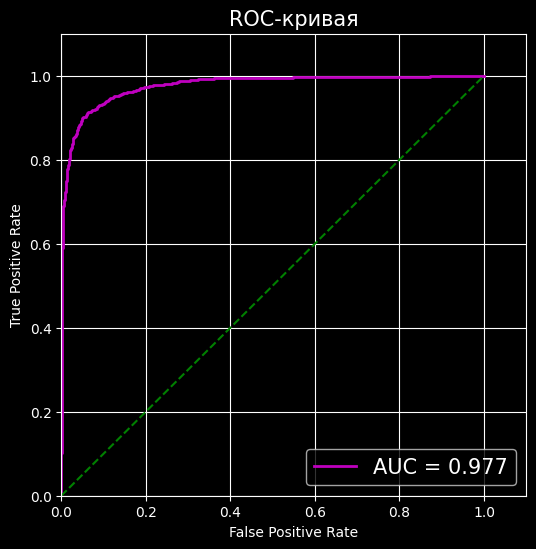

In [146]:
fpr, tpr, threshold = roc_curve(test4['y_true'], test4['y_score'])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))

plt.plot(fpr, tpr, color='m', linewidth=2, label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], 'g--')
plt.xlim([0, 1.1])
plt.ylim([0, 1.1])
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().grid(True)

plt.title('ROC-кривая', fontsize=15)
plt.legend(loc='lower right', fontsize=15)
plt.xlabel('False Positive Rate', fontsize=10)
plt.ylabel('True Positive Rate', fontsize=10)

plt.show()

# Model - KNN

In [147]:
from sklearn.neighbors import KNeighborsClassifier

In [148]:
# %%time
knn_param_grid = {
    'n_neighbors': [7, 13, 19, 25, 31],
    'weights': ['uniform', 'distance', None],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': [5, 10, 20, 30, 50],
    'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski', 'cosine',
               'braycurtis', 'canberra', 'cityblock', 'correlation',
               'jensenshannon', 'mahalanobis', 'seuclidean', 'sqeuclidean',
               'l1', 'l2', 'haversine', 'nan_euclidean'],
    'n_jobs': [-1],
}

knn = KNeighborsClassifier()
knn_search = RandomizedSearchCV(
    knn,
    n_iter=500,
    param_distributions=knn_param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    verbose=50,
    random_state=42,
    return_train_score=True
    )
# knn_search.fit(X_train, y_train)
# best_params = knn_search.best_params_
# print(best_params)

# лучшие параметры: {'weights': 'distance', 'n_neighbors': 19,
# 'metric': 'canberra', 'leaf_size': 50, 'algorithm': 'auto'}

In [149]:
%%time
knn = KNeighborsClassifier(
    n_neighbors=19,
    weights='uniform',
    metric='manhattan',
    n_jobs=-1
)
knn.fit(X_train, y_train)

CPU times: user 26.5 ms, sys: 12 µs, total: 26.5 ms
Wall time: 26.7 ms


KNeighborsClassifier(metric='manhattan', n_jobs=-1, n_neighbors=19)

In [150]:
knn.predict_proba(X_test)[:10]

array([[0.94736842, 0.05263158],
       [0.84210526, 0.15789474],
       [1.        , 0.        ],
       [1.        , 0.        ],
       [0.10526316, 0.89473684],
       [1.        , 0.        ],
       [0.42105263, 0.57894737],
       [1.        , 0.        ],
       [0.42105263, 0.57894737],
       [0.63157895, 0.36842105]])

In [151]:
X_test_copy5 = X_test.copy()

In [152]:
test5 = pd.DataFrame(X_test_copy5)
test5['y_true'] = pd.Series(y_test)
test5['y_score'] = knn.predict_proba(X_test)[:, 1]
test5['y_pred'] = (test5['y_score'] >= 0.5) * 1
test5

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.052632,0
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.157895,0
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.000000,0
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.000000,0
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.894737,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.000000,0
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.894737,1
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.368421,0
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.894737,1


In [153]:
test5.y_true.mean(), test5.y_pred.mean()

(0.35025, 0.29925)

In [154]:
test5.y_true.value_counts(), test5.y_pred.value_counts()

(0    2599
 1    1401
 Name: y_true, dtype: int64,
 0    2803
 1    1197
 Name: y_pred, dtype: int64)

In [155]:
test5['conf_matrix'] = test5.apply(get_conf_matrix, axis=1)
test5

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred,conf_matrix
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.052632,0,tn
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.157895,0,tn
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.000000,0,tn
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.000000,0,tn
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.894737,1,tp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.000000,0,tn
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.894737,1,tp
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.368421,0,fn
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.894737,1,tp


In [156]:
test5.conf_matrix.value_counts()

tn    2522
tp    1120
fn     281
fp      77
Name: conf_matrix, dtype: int64

### Visualization

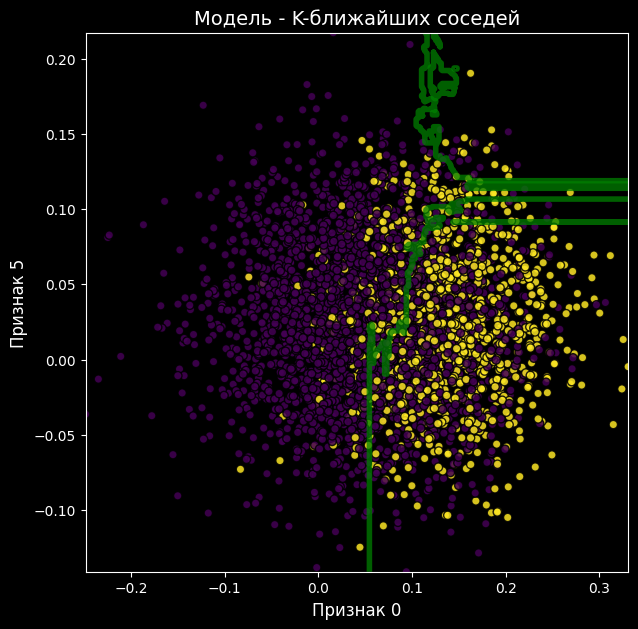

In [157]:
# Создание сетки для построения разделяющей линии
xx, yy = np.meshgrid(np.linspace(X_test[0].min(), X_test[0].max(), 500),
                     np.linspace(X_test[5].min(), X_test[5].max(), 500))

# Получение предсказаний для каждой точки на сетке
Z = knn.predict(np.c_[xx.ravel(), yy.ravel(),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel())])
Z = Z.reshape(xx.shape)

# Визуализация данных
plt.figure(figsize=(7, 7))
plt.scatter(X_test[0], X_test[5], c=knn.predict(X_test), cmap='viridis',
            marker='o', edgecolors='k', alpha=0.85)

# Визуализация разделяющей линии
plt.contour(xx, yy, Z, levels=[0], linewidths=4, colors='green', alpha=0.75)

# Дополнительные детали графика
plt.xlabel('Признак 0', fontsize=12)
plt.ylabel('Признак 5', fontsize=12)
plt.title('Модель - K-ближайших соседей', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

### Metrics

In [158]:
logloss = log_loss(test5['y_true'], test5['y_score'])
print(f'Log Loss на тестовых данных: {logloss:.4f}')

Log Loss на тестовых данных: 0.3239


In [159]:
print(f'Score на тренировочных данных: {knn.score(X_train, y_train):.4f}')
print(f'Score на тестовых данных: {knn.score(X_test, y_test):.4f}')

Score на тренировочных данных: 0.9088
Score на тестовых данных: 0.9105


In [160]:
tn, fp, fn, tp = confusion_matrix(test5.y_true, test5.y_pred).ravel()
tn, fp, fn, tp

(2522, 77, 281, 1120)

In [161]:
print(classification_report(test5['y_true'], test5['y_pred']))

              precision    recall  f1-score   support

           0       0.90      0.97      0.93      2599
           1       0.94      0.80      0.86      1401

    accuracy                           0.91      4000
   macro avg       0.92      0.88      0.90      4000
weighted avg       0.91      0.91      0.91      4000



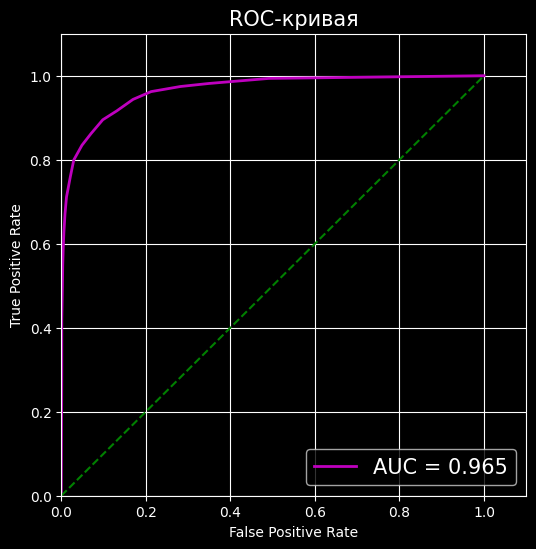

In [162]:
fpr, tpr, threshold = roc_curve(test5['y_true'], test5['y_score'])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))

plt.plot(fpr, tpr, color='m', linewidth=2, label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], 'g--')
plt.xlim([0, 1.1])
plt.ylim([0, 1.1])
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().grid(True)

plt.title('ROC-кривая', fontsize=15)
plt.legend(loc='lower right', fontsize=15)
plt.xlabel('False Positive Rate', fontsize=10)
plt.ylabel('True Positive Rate', fontsize=10)

plt.show()

# Model - SVM

In [163]:
from sklearn import svm

In [164]:
# %%time
svm_svc_param_grid = {
    'C': [0.001, 0.1, 1, 10],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'degree': [1, 3, 5],
    'gamma': [0.001, 0.01, 0.1, 1, 10, 'scale', 'auto'],
    'class_weight': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65},
                      'balanced', None],
    'decision_function_shape': ['ovo', 'ovr'],
    'random_state': [42]
}

svm_svc = svm.SVC()
svm_svc_search = RandomizedSearchCV(
    svm_svc,
    n_iter=200,
    param_distributions=svm_svc_param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    verbose=50,
    random_state=42,
    return_train_score=True
    )
# svm_svc_search.fit(X_train, y_train)
# best_params = svm_svc_search.best_params_
# print(best_params)

# лучшие параметры: {'kernel': 'rbf', 'gamma': 'scale', 'degree': 1,
# 'decision_function_shape': 'ovr', 'class_weight': None, 'C': 10}

In [165]:
%%time
svm_svc = svm.SVC(
    C=50,
    probability=True,
    verbose=True
    )
svm_svc.fit(X_train, y_train)

[LibSVM]CPU times: user 16.5 s, sys: 186 ms, total: 16.7 s
Wall time: 16.8 s


SVC(C=50, probability=True, verbose=True)

In [166]:
svm_svc.predict_proba(X_test)[:10]

array([[9.63483345e-01, 3.65166547e-02],
       [9.42352725e-01, 5.76472754e-02],
       [9.99886537e-01, 1.13462870e-04],
       [9.98894468e-01, 1.10553172e-03],
       [7.34663960e-02, 9.26533604e-01],
       [9.55581763e-01, 4.44182372e-02],
       [2.72873641e-02, 9.72712636e-01],
       [9.95511575e-01, 4.48842491e-03],
       [4.20114545e-01, 5.79885455e-01],
       [7.13246699e-01, 2.86753301e-01]])

In [167]:
X_test_copy6 = X_test.copy()

In [168]:
test6 = pd.DataFrame(X_test_copy6)
test6['y_true'] = pd.Series(y_test)
test6['y_score'] = svm_svc.predict_proba(X_test)[:, 1]
test6['y_pred'] = (test6['y_score'] >= 0.5) * 1
test6

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.036517,0
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.057647,0
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.000113,0
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.001106,0
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.926534,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.055025,0
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.974593,1
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.268629,0
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,1.000000,1


In [169]:
test6.y_true.mean(), test6.y_pred.mean()

(0.35025, 0.317)

In [170]:
test6.y_true.value_counts(), test6.y_pred.value_counts()

(0    2599
 1    1401
 Name: y_true, dtype: int64,
 0    2732
 1    1268
 Name: y_pred, dtype: int64)

In [171]:
test6['conf_matrix'] = test6.apply(get_conf_matrix, axis=1)
test6

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred,conf_matrix
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.036517,0,tn
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.057647,0,tn
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.000113,0,tn
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.001106,0,tn
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.926534,1,tp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.055025,0,tn
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.974593,1,tp
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.268629,0,fn
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,1.000000,1,tp


In [172]:
test6.conf_matrix.value_counts()

tn    2530
tp    1199
fn     202
fp      69
Name: conf_matrix, dtype: int64

### Attributes and Visualization

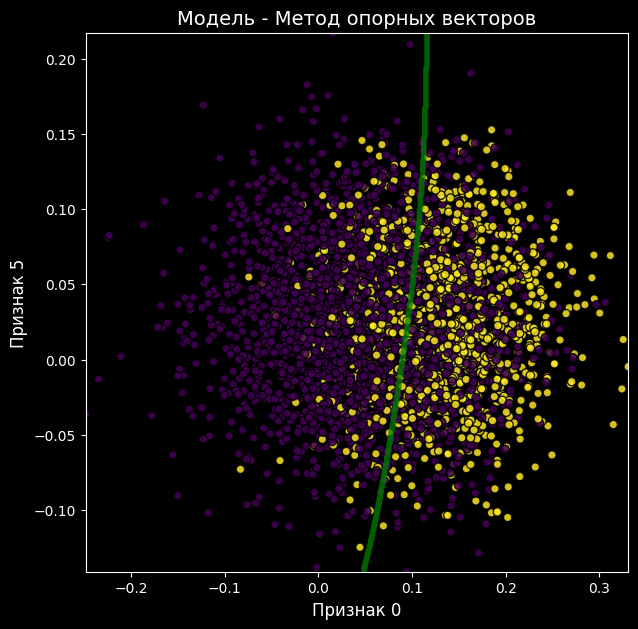

In [173]:
# Создание сетки для построения разделяющей линии
xx, yy = np.meshgrid(np.linspace(X_test[0].min(), X_test[0].max(), 500),
                     np.linspace(X_test[5].min(), X_test[5].max(), 500))

# Получение предсказаний для каждой точки на сетке
Z = svm_svc.predict(np.c_[xx.ravel(), yy.ravel(),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel())])
Z = Z.reshape(xx.shape)

# Визуализация данных
plt.figure(figsize=(7, 7))
plt.scatter(X_test[0], X_test[5], c=svm_svc.predict(X_test), cmap='viridis',
            marker='o', edgecolors='k', alpha=0.85)

# Визуализация разделяющей линии
plt.contour(xx, yy, Z, levels=[0], linewidths=4, colors='green', alpha=0.75)

# Дополнительные детали графика
plt.xlabel('Признак 0', fontsize=12)
plt.ylabel('Признак 5', fontsize=12)
plt.title('Модель - Метод опорных векторов', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

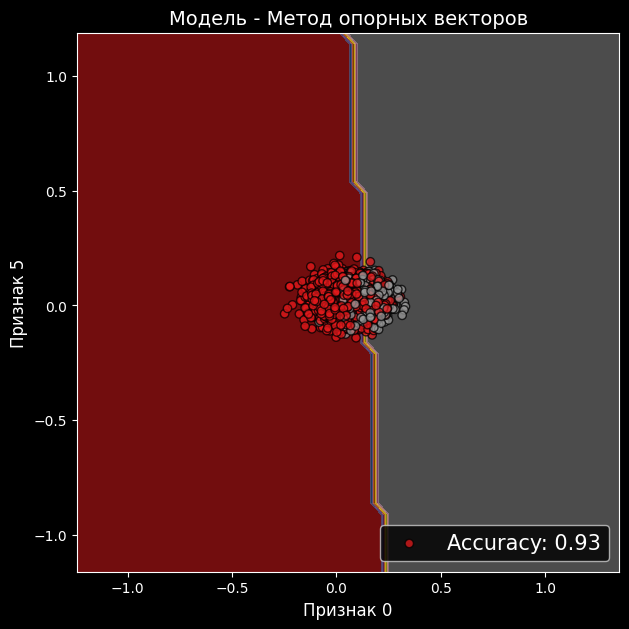

In [174]:
X = X_train[[0, 5]]
X = X.values
y = y_train

svc = svm.SVC(C=50, gamma=0.01).fit(X, y)

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.05), np.arange(y_min, y_max, 0.05))

plt.figure(figsize=(7, 7))
plt.subplot(1, 1, 1)
Z = svc.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)


plt.contourf(xx, yy, Z, cmap=plt.cm.Set1, alpha=0.5)
plt.scatter(X_test[0], X_test[5], c=svm_svc.predict(X_test),
            alpha=0.75, cmap=plt.cm.Set1, edgecolor='k',
            label=f'Accuracy: {accuracy_score(test6.y_true, test6.y_pred):.2f}')
plt.legend(loc='lower right', fontsize=15)
plt.xlim(xx.min(), xx.max())
plt.xlabel('Признак 0', fontsize=12)
plt.ylabel('Признак 5', fontsize=12)
plt.title('Модель - Метод опорных векторов', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

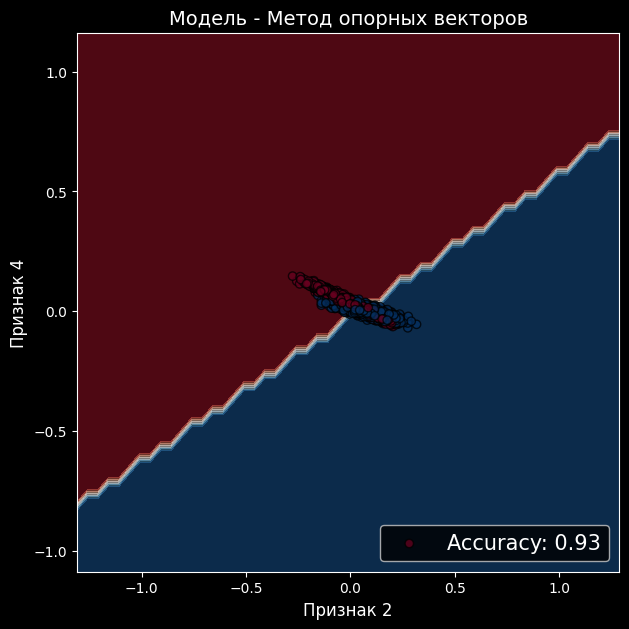

In [175]:
X = X_train[[2, 4]]
X = X.values
y = y_train

svc = svm.SVC(C=50, gamma=0.01).fit(X, y)

x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.05), np.arange(y_min, y_max, 0.05))

plt.figure(figsize=(7, 7))
plt.subplot(1, 1, 1)
Z = svc.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)


plt.contourf(xx, yy, Z, cmap=plt.cm.RdBu, alpha=0.5)
plt.scatter(X_test[2], X_test[4], c=svm_svc.predict(X_test),
            alpha=0.75, cmap=plt.cm.RdBu, edgecolor='k',
            label=f'Accuracy: {accuracy_score(test6.y_true, test6.y_pred):.2f}')
plt.legend(loc='lower right', fontsize=15)
plt.xlim(xx.min(), xx.max())
plt.xlabel('Признак 2', fontsize=12)
plt.ylabel('Признак 4', fontsize=12)
plt.title('Модель - Метод опорных векторов', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

### Metrics

In [176]:
logloss = log_loss(test6['y_true'], test6['y_score'])
print(f'Log Loss на тестовых данных: {logloss:.4f}')

Log Loss на тестовых данных: 0.1757


In [177]:
print(f'Score на тренировочных данных: {svm_svc.score(X_train, y_train):.4f}')
print(f'Score на тестовых данных: {svm_svc.score(X_test, y_test):.4f}')

Score на тренировочных данных: 0.9364
Score на тестовых данных: 0.9323


In [178]:
tn, fp, fn, tp = confusion_matrix(test6.y_true, test6.y_pred).ravel()
tn, fp, fn, tp

(2530, 69, 202, 1199)

In [179]:
print(classification_report(test6['y_true'], test6['y_pred']))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2599
           1       0.95      0.86      0.90      1401

    accuracy                           0.93      4000
   macro avg       0.94      0.91      0.92      4000
weighted avg       0.93      0.93      0.93      4000



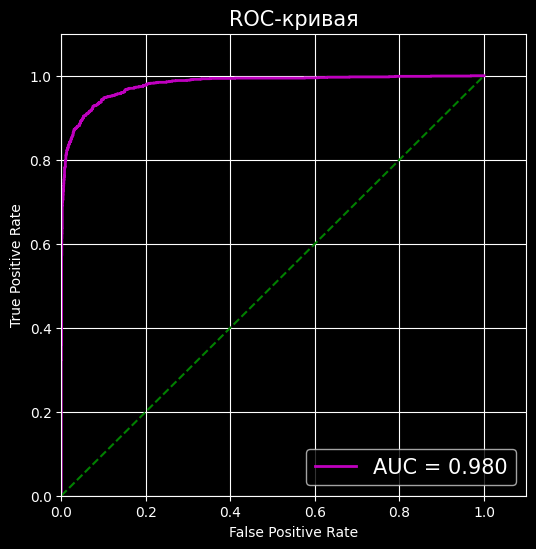

In [180]:
fpr, tpr, threshold = roc_curve(test6['y_true'], test6['y_score'])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))

plt.plot(fpr, tpr, color='m', linewidth=2, label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], 'g--')
plt.xlim([0, 1.1])
plt.ylim([0, 1.1])
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().grid(True)

plt.title('ROC-кривая', fontsize=15)
plt.legend(loc='lower right', fontsize=15)
plt.xlabel('False Positive Rate', fontsize=10)
plt.ylabel('True Positive Rate', fontsize=10)

plt.show()

# Model - Naive Bayes

In [181]:
from sklearn.naive_bayes import (BernoulliNB, GaussianNB, ComplementNB,
MultinomialNB)

In [182]:
# %%time
nb_param_grid = {
   'priors': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65}, None],
   'var_smoothing': [1e-9, 0.000001, 0.0001, 0.1, 1, 10],

   # 'alpha': [0.00001, 0.001, 0.1, 1, 10],
   # 'force_alpha': [True],
   # 'class_prior': [{0: 0.65, 1: 0.35}, {0: 0.35, 1: 0.65}, None],
   # 'binarize': [None, 0, 0.5]
}


nb = GaussianNB()
# nb = BernoulliNB()

nb_search = RandomizedSearchCV(
    nb,
    n_iter=25,
    param_distributions=nb_param_grid,
    cv=5,
    scoring='f1',
    n_jobs=-1,
    verbose=50,
    random_state=42,
    return_train_score=True
    )
# nb_search.fit(X_train, y_train)
# best_params = nb_search.best_params_
# print(best_params)

# лучшие параметры: {'var_smoothing': 1e-09, 'priors': None} GaussianNB()
# {'force_alpha': True, 'class_prior': None, 'binarize': 0, 'alpha': 1} BernoulliNB()

In [183]:
%%time
nb = GaussianNB()
nb.fit(X_train, y_train)

CPU times: user 8.95 ms, sys: 0 ns, total: 8.95 ms
Wall time: 9.39 ms


GaussianNB()

In [184]:
nb.predict_proba(X_test)[:10]

array([[8.68366624e-01, 1.31633376e-01],
       [9.21901662e-01, 7.80983383e-02],
       [9.97198805e-01, 2.80119548e-03],
       [9.96969616e-01, 3.03038432e-03],
       [8.07438911e-02, 9.19256109e-01],
       [9.99976032e-01, 2.39677340e-05],
       [6.61336969e-01, 3.38663031e-01],
       [9.74572384e-01, 2.54276155e-02],
       [1.65178765e-01, 8.34821235e-01],
       [1.37695927e-01, 8.62304073e-01]])

In [185]:
X_test_copy7 = X_test.copy()

In [186]:
test7 = pd.DataFrame(X_test_copy7)
test7['y_true'] = pd.Series(y_test)
test7['y_score'] = nb.predict_proba(X_test)[:, 1]
test7['y_pred'] = (test7['y_score'] >= 0.5) * 1
test7

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.131633,0
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.078098,0
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.002801,0
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.003030,0
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.919256,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.000004,0
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.961071,1
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.360474,0
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.613724,1


In [187]:
test7.y_true.mean(), test7.y_pred.mean()

(0.35025, 0.411)

In [188]:
test7.y_true.value_counts(), test7.y_pred.value_counts()

(0    2599
 1    1401
 Name: y_true, dtype: int64,
 0    2356
 1    1644
 Name: y_pred, dtype: int64)

In [189]:
test7['conf_matrix'] = test7.apply(get_conf_matrix, axis=1)
test7

,0,1,2,3,4,5,6,7,8,9,y_true,y_score,y_pred,conf_matrix
2562,0.037710,0.084866,0.002206,0.006319,0.031876,0.114638,0.004413,0.000428,0.023988,-0.037564,0,0.131633,0,tn
9898,0.045327,0.146648,-0.018356,-0.003496,0.035225,0.026302,-0.042880,-0.008439,0.082458,0.082008,0,0.078098,0,tn
279,0.012569,0.120561,-0.048749,-0.019501,0.059509,0.083970,0.031135,-0.022234,0.011828,0.029392,0,0.002801,0,tn
7554,0.050165,0.193305,-0.057428,-0.048057,0.060499,0.100062,0.009672,-0.058187,-0.000659,-0.026291,0,0.003030,0,tn
9454,0.092626,0.001737,0.095658,0.015187,-0.002578,0.011889,0.043590,0.013409,0.040544,0.042788,1,0.919256,1,tp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7622,-0.057910,0.171012,-0.142403,0.013744,0.081660,0.004616,-0.016603,-0.032410,0.104002,0.114000,0,0.000004,0,tn
15396,0.161850,0.070724,0.116285,-0.006563,-0.018971,-0.032520,0.014125,-0.030961,0.142498,0.012692,1,0.961071,1,tp
1718,0.189741,0.335850,0.022351,-0.115628,0.027008,-0.000292,-0.116944,-0.065523,0.047889,-0.028125,1,0.360474,0,fn
15497,0.089937,0.120248,0.022668,0.020085,0.006409,0.005399,-0.027836,-0.038333,0.024444,0.049120,1,0.613724,1,tp


In [190]:
test7.conf_matrix.value_counts()

tn    2015
tp    1060
fp     584
fn     341
Name: conf_matrix, dtype: int64

### Visualization

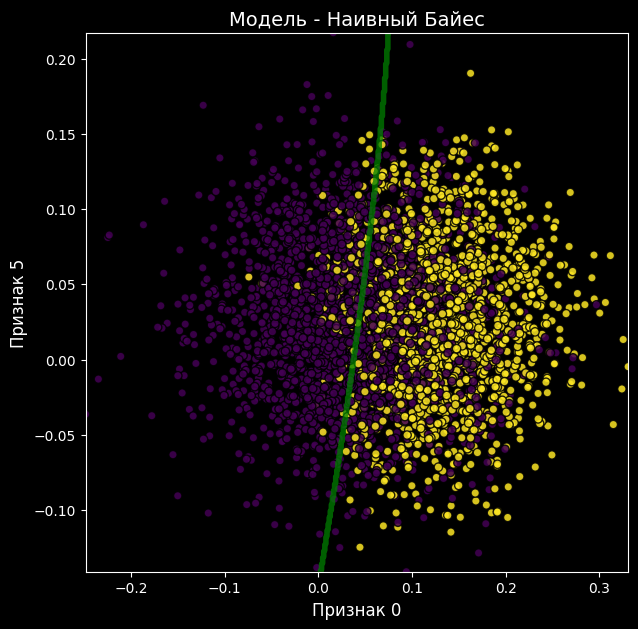

In [191]:
# Создание сетки для построения разделяющей линии
xx, yy = np.meshgrid(np.linspace(X_test[0].min(), X_test[0].max(), 500),
                     np.linspace(X_test[5].min(), X_test[5].max(), 500))

# Получение предсказаний для каждой точки на сетке
Z = nb.predict(np.c_[xx.ravel(), yy.ravel(),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel()),
                          np.zeros_like(xx.ravel()), np.zeros_like(xx.ravel())])
Z = Z.reshape(xx.shape)

# Визуализация данных
plt.figure(figsize=(7, 7))
plt.scatter(X_test[0], X_test[5], c=nb.predict(X_test), cmap='viridis',
            marker='o', edgecolors='k', alpha=0.85)

# Визуализация разделяющей линии
plt.contour(xx, yy, Z, levels=[0], linewidths=4, colors='green', alpha=0.75)

# Дополнительные детали графика
plt.xlabel('Признак 0', fontsize=12)
plt.ylabel('Признак 5', fontsize=12)
plt.title('Модель - Наивный Байес', fontsize=14)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

### Metrics

In [192]:
logloss = log_loss(test7['y_true'], test7['y_score'])
print(f'Log Loss на тестовых данных: {logloss:.4f}')

Log Loss на тестовых данных: 0.5417


In [193]:
print(f'Score на тренировочных данных: {nb.score(X_train, y_train):.4f}')
print(f'Score на тестовых данных: {nb.score(X_test, y_test):.4f}')

Score на тренировочных данных: 0.7634
Score на тестовых данных: 0.7688


In [194]:
tn, fp, fn, tp = confusion_matrix(test7.y_true, test7.y_pred).ravel()
tn, fp, fn, tp

(2015, 584, 341, 1060)

In [195]:
print(classification_report(test7['y_true'], test7['y_pred']))

              precision    recall  f1-score   support

           0       0.86      0.78      0.81      2599
           1       0.64      0.76      0.70      1401

    accuracy                           0.77      4000
   macro avg       0.75      0.77      0.75      4000
weighted avg       0.78      0.77      0.77      4000



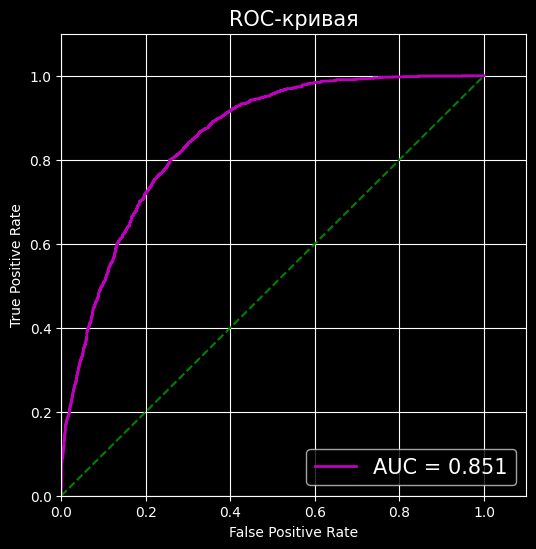

In [196]:
fpr, tpr, threshold = roc_curve(test7['y_true'], test7['y_score'])
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6, 6))

plt.plot(fpr, tpr, color='m', linewidth=2, label='AUC = %0.3f' % roc_auc)
plt.plot([0, 1], [0, 1], 'g--')
plt.xlim([0, 1.1])
plt.ylim([0, 1.1])
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.gca().grid(True)

plt.title('ROC-кривая', fontsize=15)
plt.legend(loc='lower right', fontsize=15)
plt.xlabel('False Positive Rate', fontsize=10)
plt.ylabel('True Positive Rate', fontsize=10)

plt.show()